In [1]:
#Import All the Libraries that are need to excute the code 

import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import hvplot.pandas
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report
from IPython.display import YouTubeVideo
from IPython.display import Image


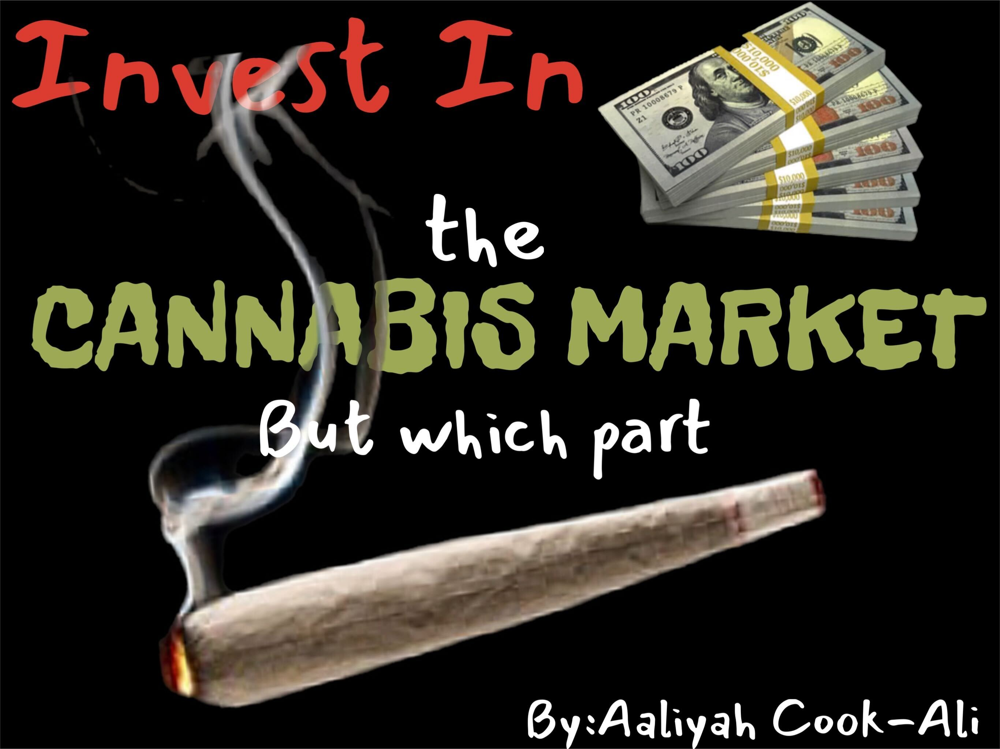

In [2]:
Image(filename='IMG_1341.jpg', width=900, height=800)


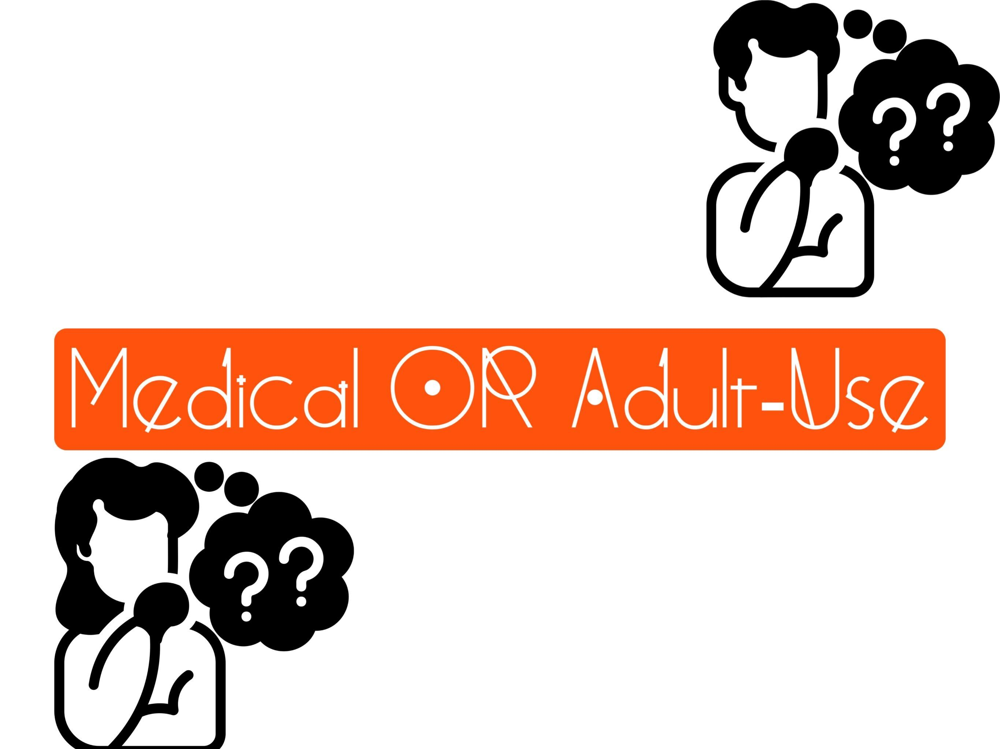

In [3]:
Image(filename='IMG_1338.jpg', width=900, height=800)


Cleaning the DataFrame

In [4]:
# read in the CSV File collected from Data.Gov 
csv_path = Path('Cannabis_Retail_Products_Sold_by_Product_Type-Copy1.csv')
cannabis_df = pd.read_csv('Cannabis_Retail_Products_Sold_by_Product_Type-Copy1.csv')
cannabis_df.head()

,Month Ending,Product Type,Retail Sales Amount,Market
0,January 2023,Usable Cannabis (Flower),2819150.84,Adult-Use
1,January 2023,Vape Cartridge,721223.06,Adult-Use
2,January 2023,Infused Edible,688928.99,Adult-Use
3,January 2023,Extract for Inhalation,868829.67,Adult-Use
4,January 2023,Usable Cannabis (Flower),4343508.44,Medical


In [5]:
#identifying the DatFrame data types
cannabis_df.dtypes

Month Ending            object
Product Type            object
Retail Sales Amount    float64
Market                  object
dtype: object

In [6]:
#Assessing the data quality by identifying the number of rows
cannabis_df.count()

Month Ending           117
Product Type           117
Retail Sales Amount    117
Market                 117
dtype: int64

In [7]:
#check the DataFrame for nulls
cannabis_df.isnull()

,Month Ending,Product Type,Retail Sales Amount,Market
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
112,False,False,False,False
113,False,False,False,False
114,False,False,False,False
115,False,False,False,False


In [8]:
#checking to see how many nulls are in the DataFrame
cannabis_df.isnull().sum()

Month Ending           0
Product Type           0
Retail Sales Amount    0
Market                 0
dtype: int64

In [9]:
#checking for duplicates
cannabis_df.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
112    False
113    False
114    False
115    False
116    False
Length: 117, dtype: bool

In [10]:
#after checking of nulls and duplicates veiw the DataFrame again
cannabis_df

,Month Ending,Product Type,Retail Sales Amount,Market
0,January 2023,Usable Cannabis (Flower),2819150.84,Adult-Use
1,January 2023,Vape Cartridge,721223.06,Adult-Use
2,January 2023,Infused Edible,688928.99,Adult-Use
3,January 2023,Extract for Inhalation,868829.67,Adult-Use
4,January 2023,Usable Cannabis (Flower),4343508.44,Medical
...,...,...,...,...
112,January 2024,Usable Cannabis (Flower),4554873.21,Medical
113,January 2024,Vape Cartridge,2805798.45,Medical
114,January 2024,Infused Edible,788811.51,Medical
115,January 2024,Extract for Inhalation,512652.16,Medical


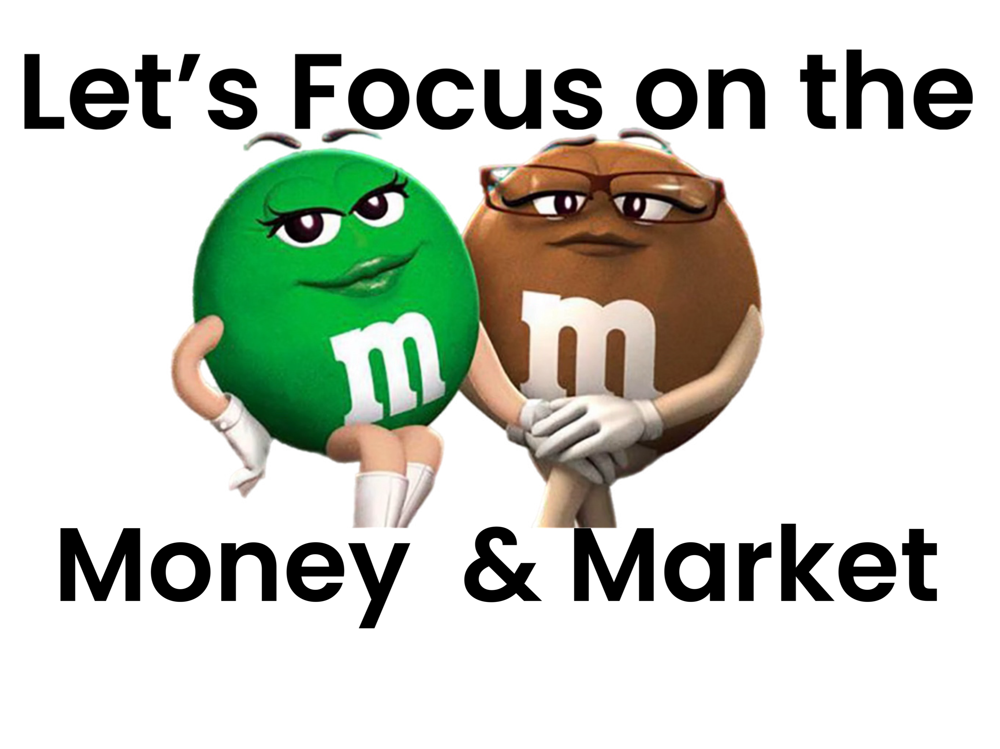

In [11]:
Image('IMG_1343.png')


In [12]:
#drop the Month ending and  Product Type beacuse the main focus is the retail sales 
#to find out which market produce the most money
cannabis_df.drop(['Month Ending','Product Type'], axis=1, inplace=True)
cannabis_df

,Retail Sales Amount,Market
0,2819150.84,Adult-Use
1,721223.06,Adult-Use
2,688928.99,Adult-Use
3,868829.67,Adult-Use
4,4343508.44,Medical
...,...,...
112,4554873.21,Medical
113,2805798.45,Medical
114,788811.51,Medical
115,512652.16,Medical


In [13]:
#Used the groupby and means function inorder 
#to calculate how much money was made from the purchase of Medical and Adult-Use cannabis in the year 2023


cannabis_calculation_df = cannabis_df.groupby('Market')['Retail Sales Amount'].mean()
cannabis_calculation_df

Market
Adult-Use    3.081462e+06
Medical      2.133082e+06
Name: Retail Sales Amount, dtype: float64

The difference in retail sales amount between Adult-Use and Medical cannabis in 2023 is: 948380.5685


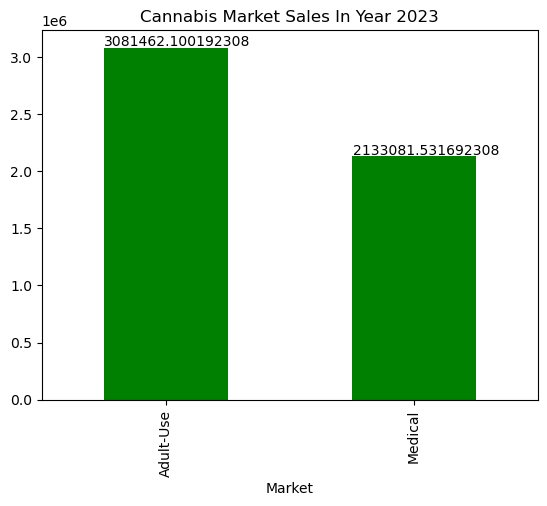

In [14]:
#Generate a bar graph presenting sales figures for both adult-use and medical of cannabis 
#then calculated difference between the two



# Calculate the difference between Medical and Adult-Use cannabis sales
difference = cannabis_calculation_df['Adult-Use'] - cannabis_calculation_df['Medical']

print("The difference in retail sales amount between Adult-Use and Medical cannabis in 2023 is:", difference)

# Plotting the combined information
ax = cannabis_calculation_df.plot(x='Market', y='Retail Sales Amount', kind='bar', color='green')
plt.title('Cannabis Market Sales In Year 2023')

# Displaying the values on top of the bars
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

plt.show()


# Nine hundred forty-eight thousand three hundred eighty dollars and fifty-six cents is the difference in sales


# A little Humor........      I Guess people are saying  

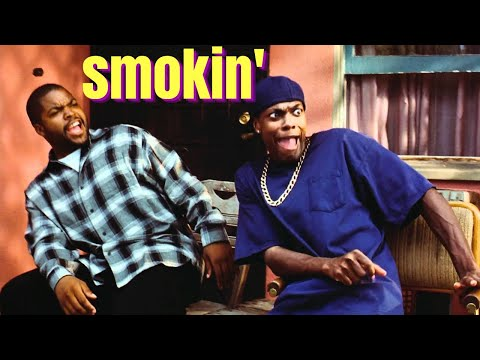

In [15]:



YouTubeVideo('cGqkuyf7-aA')

Display The Cannabis Stock & Data Set 

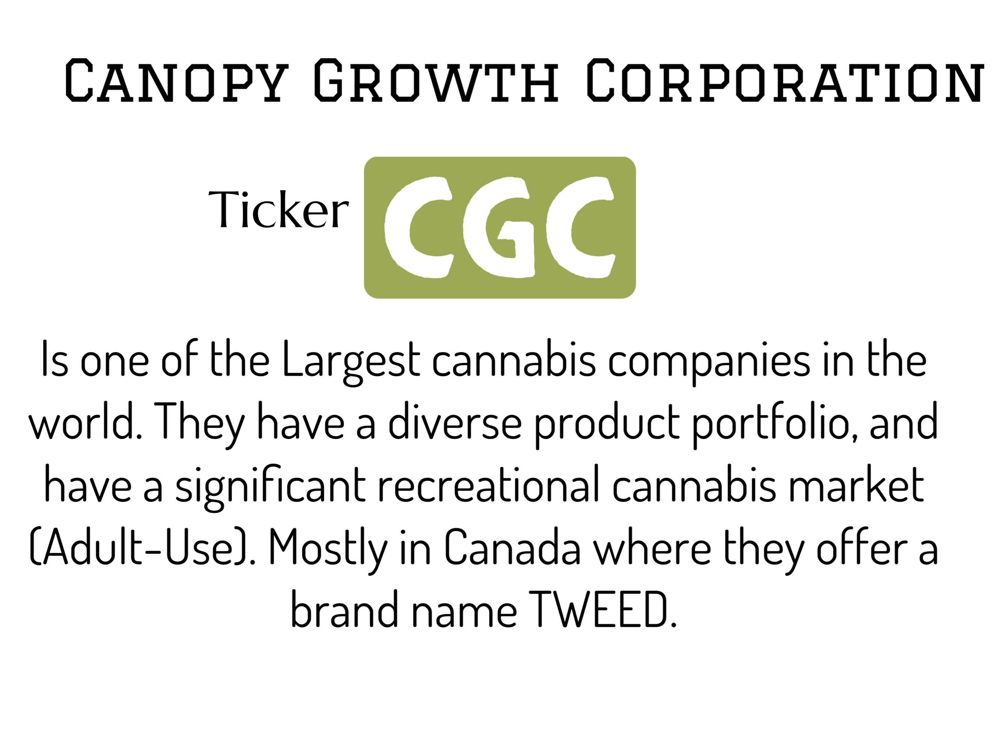

In [16]:
Image(filename='IMG_1372.jpg', width=900, height=800)


Import CSV into a DataFrame

In [17]:
# Import the CGC dataset into a Pandas Dataframe
cgc_df = pd.read_csv(
    Path("CGC_XNAS.csv"), 
    index_col='date', 
    infer_datetime_format=True, 
    parse_dates=True
)

# Review the DataFrame
cgc_df.head()

,close,volume
date,,
2015-01-21 09:30:00,4.766,120
2015-01-21 11:00:00,4.796,100
2015-01-22 15:00:00,4.884,100
2015-01-22 15:15:00,4.888,200
2015-01-22 15:30:00,4.892,200


In [18]:
# Filter the date index and close columns
cgc_signals_df = cgc_df.loc[:, ["close"]]

# Use the pct_change function to generate returns from close prices
cgc_signals_df["Actual Returns"] = cgc_signals_df["close"].pct_change()

# Drop all nulls from the DataFrame
cgc_signals_df = cgc_signals_df.dropna()

# Review the DataFrame
display(cgc_signals_df.head())
display(cgc_signals_df.tail())

,close,Actual Returns
date,,
2015-01-21 11:00:00,4.796,0.006295
2015-01-22 15:00:00,4.884,0.018349
2015-01-22 15:15:00,4.888,0.000819
2015-01-22 15:30:00,4.892,0.000818
2015-01-26 12:30:00,4.866,-0.005315


,close,Actual Returns
date,,
2021-01-22 09:30:00,6.654,-0.006866
2021-01-22 11:30:00,6.670,0.002405
2021-01-22 13:45:00,6.684,0.002099
2021-01-22 14:30:00,6.694,0.001496
2021-01-22 15:45:00,6.688,-0.000896


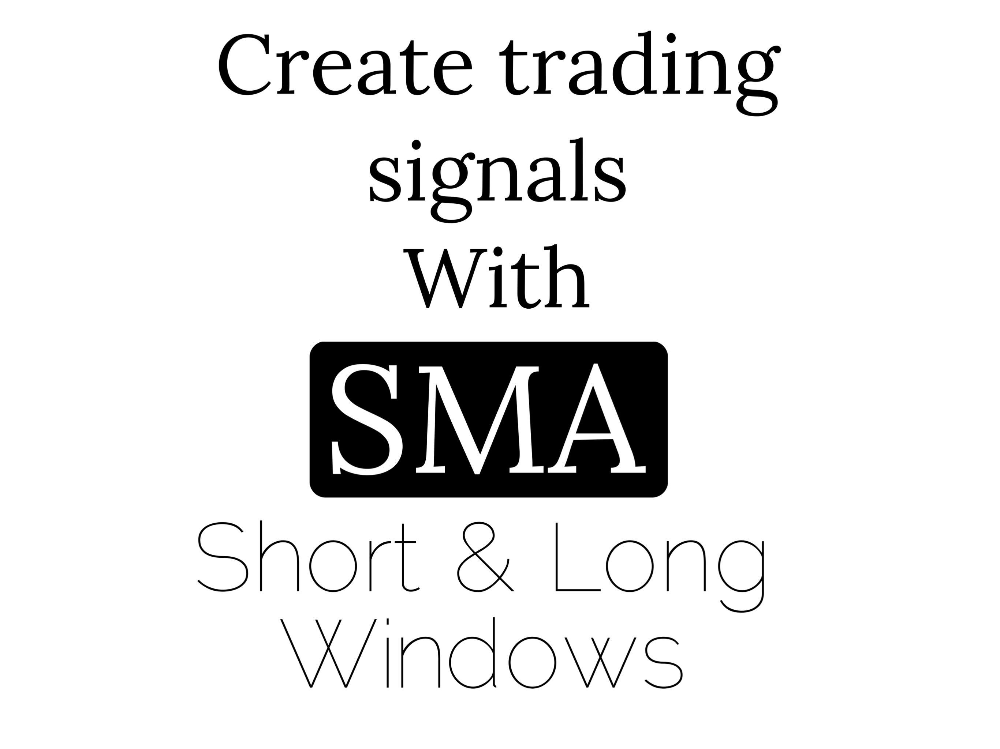

In [19]:
Image(filename='IMG_1491.jpg', width=900, height=800)

In [20]:
# Set the short window and long window
long_window = 3
short_window = 75

# Generate the fast and slow simple moving averages 
cgc_signals_df['SMA_Fast'] = cgc_signals_df['close'].rolling(window=short_window).mean()
cgc_signals_df['SMA_Slow'] = cgc_signals_df['close'].rolling(window=long_window).mean()

cgc_signals_df = cgc_signals_df.dropna()

# Review the DataFrame
display(cgc_signals_df.head())
display(cgc_signals_df.tail())

,close,Actual Returns,SMA_Fast,SMA_Slow
date,,,,
2015-03-17 13:00:00,4.834,0.000000,4.837333,4.829333
2015-03-23 14:15:00,4.894,0.012412,4.838640,4.854000
2015-03-25 11:45:00,4.850,-0.008991,4.838187,4.859333
2015-03-27 12:00:00,4.804,-0.009485,4.837067,4.849333
2015-03-27 12:15:00,4.804,0.000000,4.835893,4.819333


,close,Actual Returns,SMA_Fast,SMA_Slow
date,,,,
2021-01-22 09:30:00,6.654,-0.006866,6.162373,6.649333
2021-01-22 11:30:00,6.670,0.002405,6.173067,6.674667
2021-01-22 13:45:00,6.684,0.002099,6.183333,6.669333
2021-01-22 14:30:00,6.694,0.001496,6.193707,6.682667
2021-01-22 15:45:00,6.688,-0.000896,6.204027,6.688667


In [21]:
# Initialize the new Signal column
cgc_signals_df['Signal'] = 0.0

# When Actual Returns are greater than or equal to 0, generate signal to buy stock long
cgc_signals_df.loc[(cgc_signals_df['Actual Returns'] >= 0), 'Signal'] = 1

# When Actual Returns are less than 0, generate signal to sell stock short
cgc_signals_df.loc[(cgc_signals_df['Actual Returns'] < 0), 'Signal'] = -1

# Review the DataFrame
display(cgc_signals_df.head())
display(cgc_signals_df.tail())


,close,Actual Returns,SMA_Fast,SMA_Slow,Signal
date,,,,,
2015-03-17 13:00:00,4.834,0.000000,4.837333,4.829333,1.0
2015-03-23 14:15:00,4.894,0.012412,4.838640,4.854000,1.0
2015-03-25 11:45:00,4.850,-0.008991,4.838187,4.859333,-1.0
2015-03-27 12:00:00,4.804,-0.009485,4.837067,4.849333,-1.0
2015-03-27 12:15:00,4.804,0.000000,4.835893,4.819333,1.0


,close,Actual Returns,SMA_Fast,SMA_Slow,Signal
date,,,,,
2021-01-22 09:30:00,6.654,-0.006866,6.162373,6.649333,-1.0
2021-01-22 11:30:00,6.670,0.002405,6.173067,6.674667,1.0
2021-01-22 13:45:00,6.684,0.002099,6.183333,6.669333,1.0
2021-01-22 14:30:00,6.694,0.001496,6.193707,6.682667,1.0
2021-01-22 15:45:00,6.688,-0.000896,6.204027,6.688667,-1.0


In [22]:
#review the count value
cgc_signals_df['Signal'].value_counts()

 1.0    2385
-1.0    1863
Name: Signal, dtype: int64

In [23]:
# Calculate the strategy returns and add them to the cgc_signals_df DataFrame
cgc_signals_df['Strategy Returns'] = cgc_signals_df['Actual Returns'] * cgc_signals_df['Signal'].shift()

# Review the DataFrame
display(cgc_signals_df.head())
display(cgc_signals_df.tail())

,close,Actual Returns,SMA_Fast,SMA_Slow,Signal,Strategy Returns
date,,,,,,
2015-03-17 13:00:00,4.834,0.000000,4.837333,4.829333,1.0,NaN
2015-03-23 14:15:00,4.894,0.012412,4.838640,4.854000,1.0,0.012412
2015-03-25 11:45:00,4.850,-0.008991,4.838187,4.859333,-1.0,-0.008991
2015-03-27 12:00:00,4.804,-0.009485,4.837067,4.849333,-1.0,0.009485
2015-03-27 12:15:00,4.804,0.000000,4.835893,4.819333,1.0,-0.000000


,close,Actual Returns,SMA_Fast,SMA_Slow,Signal,Strategy Returns
date,,,,,,
2021-01-22 09:30:00,6.654,-0.006866,6.162373,6.649333,-1.0,-0.006866
2021-01-22 11:30:00,6.670,0.002405,6.173067,6.674667,1.0,-0.002405
2021-01-22 13:45:00,6.684,0.002099,6.183333,6.669333,1.0,0.002099
2021-01-22 14:30:00,6.694,0.001496,6.193707,6.682667,1.0,0.001496
2021-01-22 15:45:00,6.688,-0.000896,6.204027,6.688667,-1.0,-0.000896


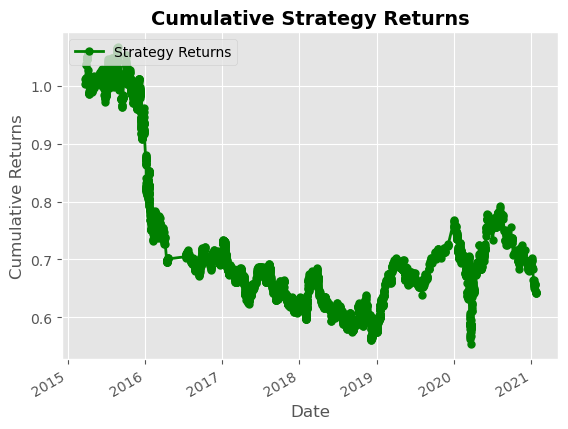

In [24]:
#Create a time series plot of cumulative strategy returns with a ggplot style

# Set the style
plt.style.use('ggplot')

# Plot Strategy Returns to examine performance
(1 + cgc_signals_df['Strategy Returns']).cumprod().plot(color='green', linewidth=2, linestyle='-', marker='o', markersize=5)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Cumulative Returns', fontsize=12)
plt.title('Cumulative Strategy Returns', fontsize=14, fontweight='bold')
plt.legend(['Strategy Returns'], loc='upper left', fontsize=10)
plt.grid(True)
plt.show()

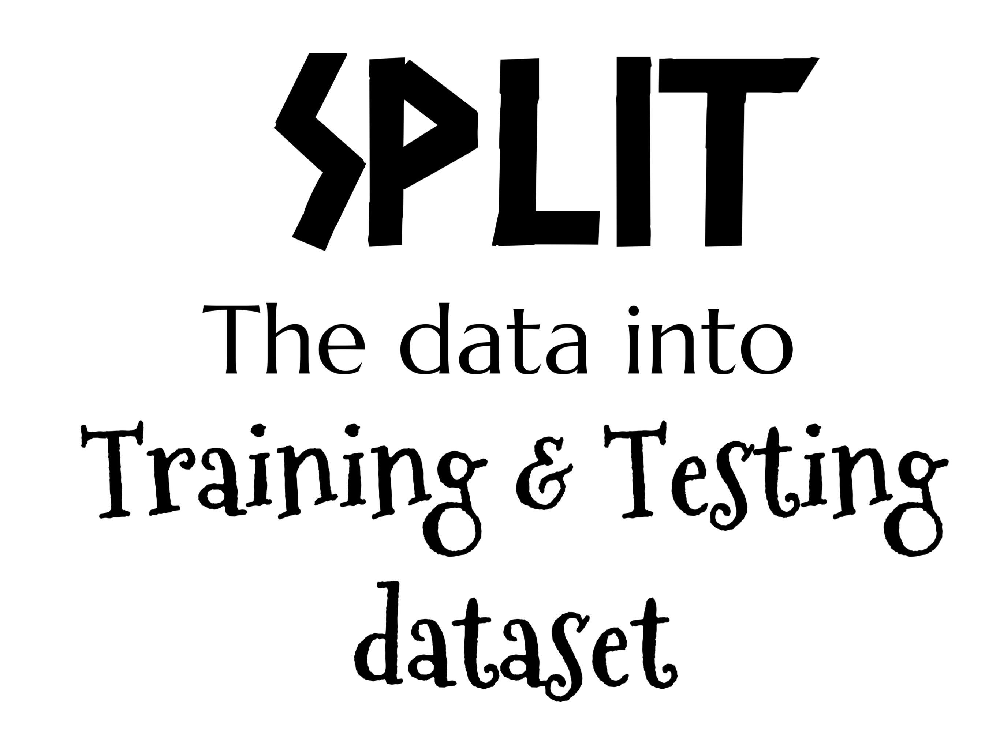

In [25]:
Image(filename='IMG_1490.jpg', width=900, height=800)

In [26]:
# Assign a copy of the sma_fast and sma_slow columns to a features DataFrame called X
X = cgc_signals_df[['SMA_Fast', 'SMA_Slow']].shift().dropna()

# Review the DataFrame
X.head()

,SMA_Fast,SMA_Slow
date,,
2015-03-23 14:15:00,4.837333,4.829333
2015-03-25 11:45:00,4.838640,4.854000
2015-03-27 12:00:00,4.838187,4.859333
2015-03-27 12:15:00,4.837067,4.849333
2015-03-27 12:30:00,4.835893,4.819333


In [27]:
# Create the target set selecting the Signal column and assiging it to y
y = cgc_signals_df['Signal']

# Review the value counts
y.value_counts()

 1.0    2385
-1.0    1863
Name: Signal, dtype: int64

In [28]:
# Select the start date of the training period
training_begin = X.index.min()

# Then Display the training begin date
print(training_begin)

2015-03-23 14:15:00


In [29]:
# Select the ending period for the training data with an offset of 3 months
training_end = X.index.min() + DateOffset(months=3)

# Then Display the training end date
print(training_end)

2015-06-23 14:15:00


Create The Testing Datasets

In [30]:
# Generate the X_test and y_test DataFrames
# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Review the X_train DataFrame
X_train.head()

,SMA_Fast,SMA_Slow
date,,
2015-03-23 14:15:00,4.837333,4.829333
2015-03-25 11:45:00,4.838640,4.854000
2015-03-27 12:00:00,4.838187,4.859333
2015-03-27 12:15:00,4.837067,4.849333
2015-03-27 12:30:00,4.835893,4.819333


In [31]:
# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end+DateOffset(hours=1):]
y_test = y.loc[training_end+DateOffset(hours=1):]

# Review the X_test DataFrame
X_train.head()

,SMA_Fast,SMA_Slow
date,,
2015-03-23 14:15:00,4.837333,4.829333
2015-03-25 11:45:00,4.838640,4.854000
2015-03-27 12:00:00,4.838187,4.859333
2015-03-27 12:15:00,4.837067,4.849333
2015-03-27 12:30:00,4.835893,4.819333


Standardize The Data

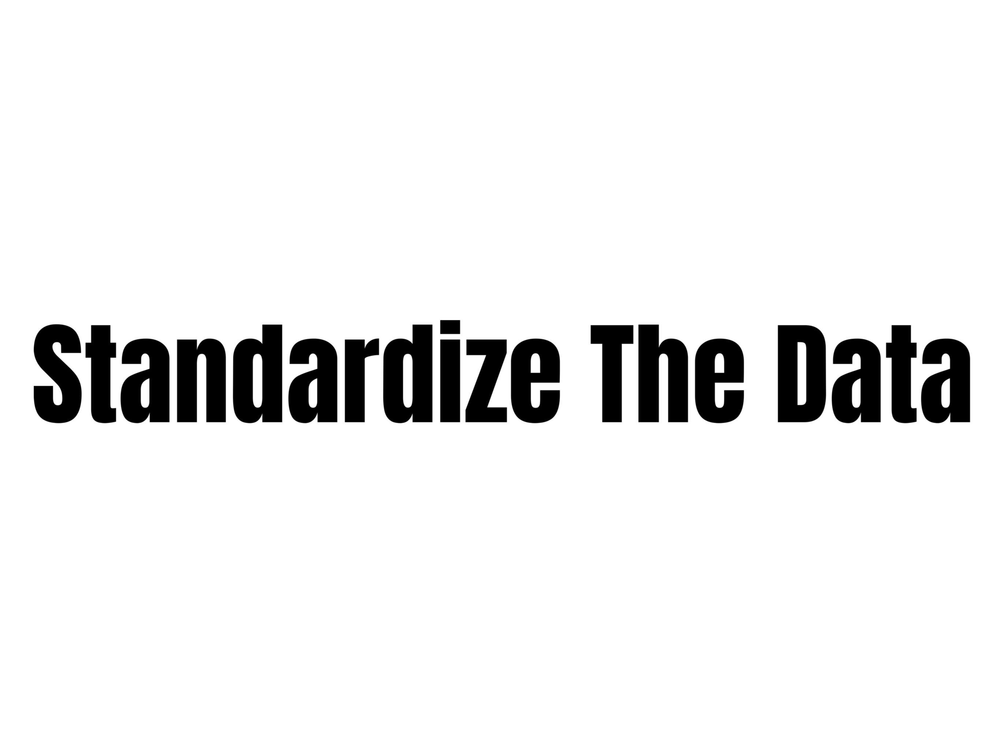

In [32]:
Image(filename='IMG_1492.jpg', width=900, height=800)

In [33]:
# Create a StandardScaler instance
scaler = StandardScaler()

# then apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

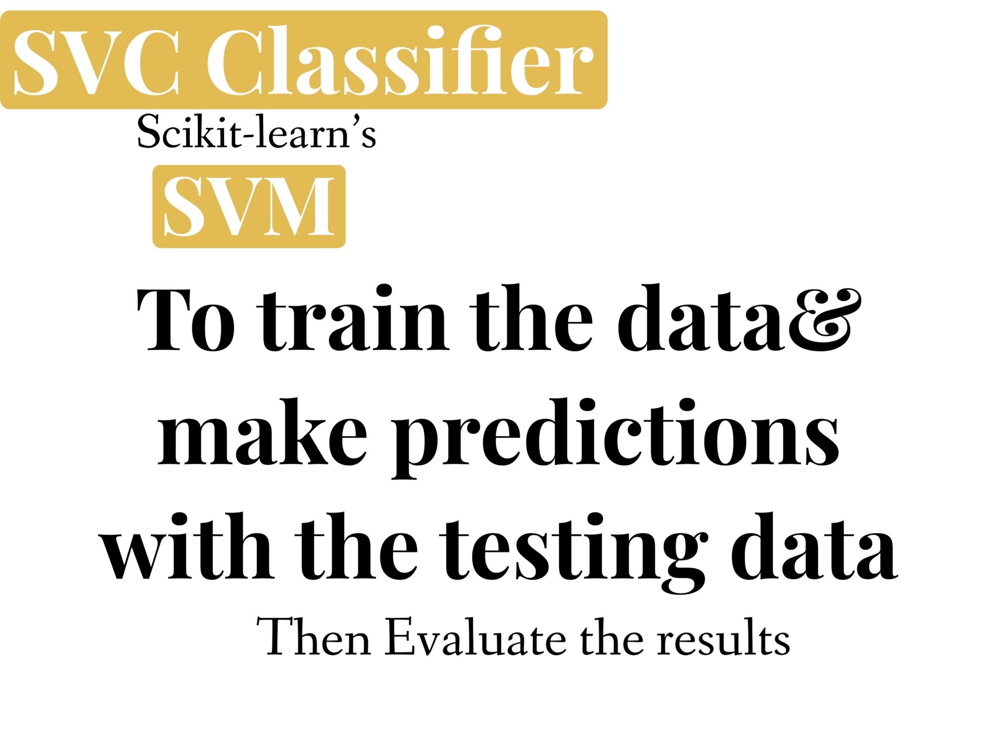

In [34]:
Image(filename='IMG_1493.jpg', width=900, height=800)

In [35]:
# from SVM, instantiate SVC classifier model instance
svm_model = svm.SVC()
 
# then Fit the model to the data using the training data
svm_model = svm_model.fit(X_train_scaled, y_train)
 
# use the testing data to make the models predictions
svm_pred = svm_model.predict(X_test_scaled)

# then review the model's predicted values
svm_pred

# which gives an array of 1.0

array([1., 1., 1., ..., 1., 1., 1.])

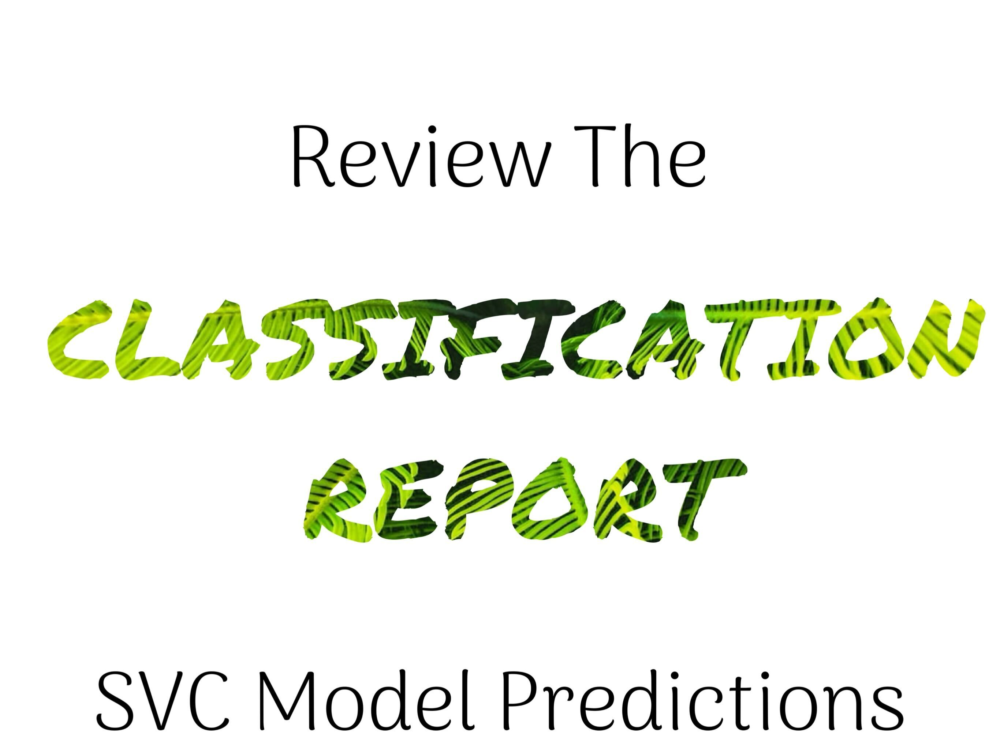

In [36]:
Image(filename='IMG_1494.jpg', width=900, height=800)

In [37]:
# by doing so we will use the classification report to evaluate the model using the predictions and testing data
svm_testing_report = classification_report(y_test, svm_pred)

# Print the classification report
print(svm_testing_report)



              precision    recall  f1-score   support

        -1.0       0.39      0.05      0.10      1813
         1.0       0.56      0.93      0.70      2297

    accuracy                           0.55      4110
   macro avg       0.47      0.49      0.40      4110
weighted avg       0.48      0.55      0.43      4110



# By printing the the SVM testing report it shows model  -1.0 precision , recall, and f1-score are preforming low
# But the 1.0 is performing well due to high precision, recall, and f1-score

Create a predictions DataFrame that contains columns for "Predicted" values, "Actual Returns", and "Strategy Returns"

In [38]:
# By using pd.DataFrame & .index to equal the cgc_predictions_df
cgc_predictions_df = pd.DataFrame(index=X_test.index)

# then added the SVM model predictions to the cgc predictions DataFrame
cgc_predictions_df['Predicted'] = svm_pred

# secondly added the actual returns to the cgc predictions DataFrame
cgc_predictions_df['Actual Returns'] = cgc_signals_df['Actual Returns']

#  Thirdly  added the strategy returns to the cgc predictions DataFrame
cgc_predictions_df['Strategy Returns'] = (
    cgc_predictions_df['Actual Returns'] * cgc_predictions_df['Predicted']
)

# Review the cgc predictions DataFrame to view the 1st five rows and the last 5 rows 
display(cgc_predictions_df.head())
display(cgc_predictions_df.tail())

,Predicted,Actual Returns,Strategy Returns
date,,,
2015-06-24 10:30:00,1.0,0.002839,0.002839
2015-06-24 15:00:00,1.0,-0.005661,-0.005661
2015-06-24 15:45:00,1.0,0.000813,0.000813
2015-06-25 10:45:00,1.0,-0.006095,-0.006095
2015-06-25 14:15:00,1.0,0.002862,0.002862


,Predicted,Actual Returns,Strategy Returns
date,,,
2021-01-22 09:30:00,1.0,-0.006866,-0.006866
2021-01-22 11:30:00,1.0,0.002405,0.002405
2021-01-22 13:45:00,1.0,0.002099,0.002099
2021-01-22 14:30:00,1.0,0.001496,0.001496
2021-01-22 15:45:00,1.0,-0.000896,-0.000896


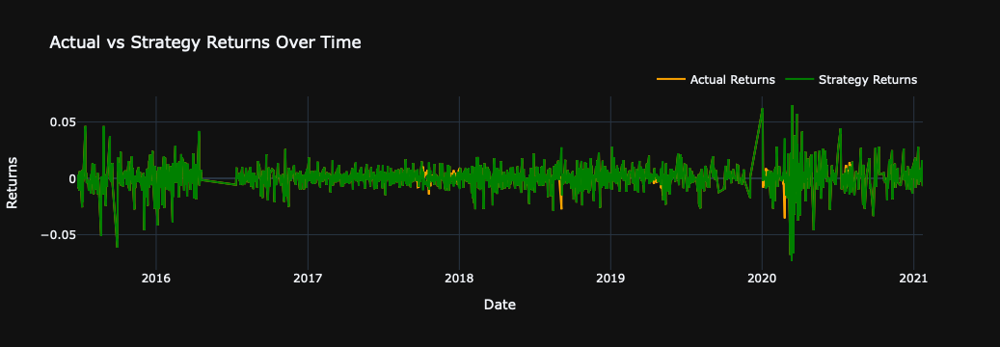

In [39]:
# Create a line plot with a scatter trace 
# To show the actual returns vs the strategy returns so we can compare the effects of the algorithm


fig = go.Figure()

# Add scatter trace for Actual Returns
fig.add_trace(go.Scatter(
    x=cgc_predictions_df.index,
    y=cgc_predictions_df['Actual Returns'],
    mode='lines',
    name='Actual Returns',
    line=dict(color='orange', width=2)
))

# Add scatter trace for Strategy Returns
fig.add_trace(go.Scatter(
    x=cgc_predictions_df.index,
    y=cgc_predictions_df['Strategy Returns'],
    mode='lines',
    name='Strategy Returns',
    line=dict(color='green', width=2)
))

# Update layout
fig.update_layout(
    title='Actual vs Strategy Returns Over Time',
    xaxis_title='Date',
    yaxis_title='Returns',
    hovermode='x',
    template='plotly_dark',  # Dark theme
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
)

# Show plot
fig.show()

This particular chart type wasn't suitable for presenting this information because it failed to accurately display the actual returns alongside the strategy returns so I created another chart


In [40]:
#created a line chart to provide a more insightful analysis of both Actual returns and Strategy return

# Plotting the actual returns versus the strategy returns with specified colors
(1 + cgc_predictions_df[['Actual Returns', 'Strategy Returns']]).cumprod().hvplot(color=['green', 'red'])


#which is presenting both the real returns and strategy returns with accurate dates, times, and values.

:NdOverlay   [Variable]
   :Curve   [date]   (value)

Which is presenting both the real returns and strategy returns with accurate dates, times, and values.


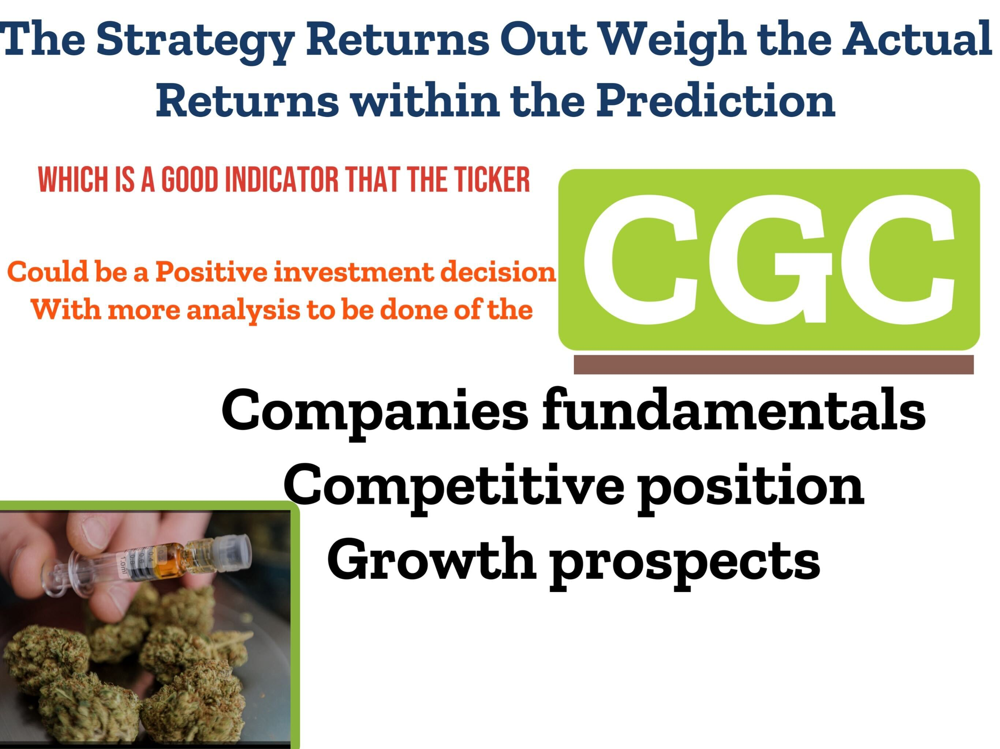

In [41]:
Image(filename='IMG_1560.jpg', width=900, height=800)